In [4]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import statsmodels.api as sm
from pandas import Series, DataFrame
from sklearn import datasets, svm
import  scipy.stats as stats
from sklearn.svm import LinearSVC
from scipy import interpolate
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.cross_validation import  cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.datasets import make_classification
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
import time
from datetime import datetime
from sklearn.feature_extraction.text import CountVectorizer

from sklearn import linear_model, decomposition, datasets
from sklearn.pipeline import Pipeline

from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.metrics import pairwise_kernels
import re
from nltk.corpus import stopwords
from dateutil.parser import parse
import nltk,string
from sklearn.feature_extraction.text import CountVectorizer
from nltk import word_tokenize          
from nltk.stem.porter import PorterStemmer
from sklearn import preprocessing
from collections import OrderedDict
from sklearn.feature_extraction.text import TfidfVectorizer
import scipy.sparse
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import HashingVectorizer
from sklearn.cross_validation import cross_val_score, ShuffleSplit
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.svm import SVC
from sklearn.datasets import load_iris
from sklearn.ensemble import AdaBoostClassifier
import pylab as pl
from math import log
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import VarianceThreshold
from sklearn.ensemble import RandomForestRegressor
from collections import Counter
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.feature_selection import RFECV
from sklearn.datasets import make_classification

### Load Input Files

In [15]:
#Read File

Data = pd.read_csv('update_yelp_data_train.dat', sep = ';',skiprows=1, dtype = None, names = ['date','reviewID','reviewerID','reviewContent','rating','usefulCount','coolCount','funnyCount','fake','hotelID'],quotechar='"' )
trainData = Data.as_matrix()
XtrainData = np.delete(trainData, -2, 1)
labelData = trainData[:,-2]

# print XtrainData.shape
# print labelData.shape

testData = pd.read_csv('update_yelp_data_test.dat', delimiter = ';',skiprows=1, dtype = None, names = ['date','reviewID','reviewerID','reviewContent','rating','usefulCount','coolCount','funnyCount','hotelID'])

data_reviewers = pd.read_csv("update_yelp_data_reviewer.dat", delimiter = ';',skiprows=1, dtype = None, names = ['reviewerID','name','location','yelpJoinDate','friendCount','reviewCount','firstCount','usefulCount','coolCount','funnyCount','complimentCount','tipCount','fanCount'])

data_hotels = pd.read_csv("update_yelp_data_hotel.dat", delimiter = ';',skiprows=1, dtype = None, names = ['hotelID','name','location','reviewCount','rating','categories','address','AcceptsCreditCards','PriceRange','WiFi','webSite','phoneNumber','filReviewCount'])

//anaconda/envs/py35/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2723: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [16]:
#Replace all N and Y Values in Train Labels to 0 and 1
mymap = {'N': 0, 'Y': 1}
Data['fake'] = Data['fake'].map(mymap ).astype(int)
Y_TrainData=Data['fake']
#Y_TrainData.index =np.arange(1,len(Y_TrainData)+1)



In [17]:
# Merging Columns based on HotelID
result_hotelID = pd.merge(Data, data_hotels, how='left', on=['hotelID'])
result_hotelID_test = pd.merge(testData, data_hotels, how='left', on=['hotelID'])

# Merging Columns based on Reviewer ID,
result_reviewerID = pd.merge(Data, data_reviewers, how='left', on=['reviewerID'])
result_reviewerID_test = pd.merge(testData, data_reviewers, how='left', on=['reviewerID'])

result_reviewer_hotelID = pd.merge(result_reviewerID, data_hotels, how='left', on=['hotelID'])
result_reviewer_hotelID_test = pd.merge(result_reviewerID_test, data_hotels, how='left', on=['hotelID'])

In [18]:
def CrossValidation_NaiveBayesClassifier(trainData,trainLabel):
    cv_scores= []
    for score in ["accuracy"]:
        scores=cross_val_score(GaussianNB(),trainData,trainLabel,scoring=score, cv=5).mean()
        cv_scores.append(scores)
    return cv_scores


def CrossValidation_DecisionTreeClassifier(trainData,trainLabel):
    cv_scores= []
    for score in ["accuracy"]:        
        scores = cross_val_score(DecisionTreeClassifier(),trainData,trainLabel,scoring=score, cv=5).mean()
        cv_scores.append(scores)
    return cv_scores


def CrossValidation_KNearestNeighbours(trainData,trainLabel,neighbours):
    cv_scores= []
    for score in ["accuracy"]:
        scores = cross_val_score(KNeighborsClassifier(n_neighbors=neighbours),trainData,trainLabel,scoring=score, cv=5).mean()   
        cv_scores.append(scores)
    return cv_scores


def CrossValidation_RandomForestn150(trainData,trainLabel):
    #trees = param['trees']
    cv_scores= []
    for score in ["accuracy"]:       
        scores = cross_val_score(RandomForestClassifier(n_estimators=150),trainData,trainLabel,scoring=score, cv=5).mean()
        cv_scores.append(scores)
    return cv_scores

def CrossValidation_RandomForestn138(trainData,trainLabel):
    #trees = param['trees']
    cv_scores= []
    for score in ["accuracy"]:       
        scores = cross_val_score(RandomForestClassifier(n_estimators=138),trainData,trainLabel,scoring=score, cv=5).mean()
        cv_scores.append(scores)
    return cv_scores

def CrossValidation_RandomForestn166(trainData,trainLabel):
    #trees = param['trees']
    cv_scores= []
    for score in ["accuracy"]:       
        scores = cross_val_score(RandomForestClassifier(n_estimators=166),trainData,trainLabel,scoring=score, cv=5).mean()
        cv_scores.append(scores)
    return cv_scores


def CrossValidation_LogisticRegression(trainData,trainLabel):
    cv_scores= []
    for score in ["accuracy"]:       
        scores = cross_val_score(LogisticRegression(),trainData,trainLabel,scoring=score, cv=5).mean()
        cv_scores.append(scores)
    return cv_scores


def CrossValidation_LogisticRegression_AdaboostClassifier(trainData,trainLabel):
    cv_scores= []
    for score in ["accuracy"]:       
        scores = cross_val_score(AdaBoostClassifier(),trainData,trainLabel,scoring=score, cv=5).mean()
        cv_scores.append(scores)
    return cv_scores

def CrossValidation_LogisticRegression_NeuralNetworkClassifier(trainData,trainLabel):
    cv_scores= []
    for score in ["accuracy"]:       
        scores = cross_val_score(Classifier(learning_rule=rule,
        learning_rate=0.02,
        n_iter=10),trainData,trainLabel,scoring=score, cv=6).mean()
        cv_scores.append(scores)
    return cv_scores

def CrossValidation_SupportVectorMachine(trainData,trainLabel):
    cv_scores= []
    for score in ["accuracy"]:       
        scores = cross_val_score(svm.SVC(kernel="linear"),trainData,trainLabel,scoring=score, cv=5).mean()
        cv_scores.append(scores)
    return cv_scores

## Feature Engineering

### Maximum Number of Reviews

In [19]:
#datenow
date_fmt= lambda x : datetime.strptime(x,"%m/%d/%Y")
date_now = result_reviewerID['date'].apply(date_fmt)
date_now_test = result_reviewerID_test['date'].apply(date_fmt)

#datejoin
date_yelpjoin_fmt = lambda x : datetime.strptime(x, "%B %Y") if not pd.isnull(x) else np.nan
date_join = result_reviewerID['yelpJoinDate'].apply(date_yelpjoin_fmt)
date_join_test = result_reviewerID_test['yelpJoinDate'].apply(date_yelpjoin_fmt)

#delta
delta =(date_now -date_join).apply(lambda x: x.days if not pd.isnull(x) else np.nan )
delta_test = (date_now_test -date_join_test).apply(lambda x: x.days if not pd.isnull(x) else np.nan )

In [20]:
result_reviewerID['MNR'] = result_reviewerID['reviewCount']/delta 
result_reviewerID_test['MNR'] = result_reviewerID_test['reviewCount']/delta_test 
result_reviewerID['MNR'] = result_reviewerID['MNR'].replace([np.inf, -np.inf, np.nan],0)
result_reviewerID_test['MNR'] = result_reviewerID_test['MNR'].replace([np.inf, -np.inf, np.nan],0)

### Percentage of Positive Reviews(PPR) 

In [21]:
result_reviewerID['PPR']= result_reviewerID['rating']/result_reviewerID['reviewCount']
result_reviewerID_test['PPR']= result_reviewerID_test['rating']/result_reviewerID_test['reviewCount']

### Review Length(RL)

In [22]:
review_length = lambda x: len(x.split()) if not pd.isnull(x) else np.nan 
result_reviewerID['RL'] = result_reviewerID['reviewContent'].apply(review_length)
result_reviewerID_test['RL'] = result_reviewerID_test['reviewContent'].apply(review_length) 


### Reviewer deviation (RD)

In [23]:
result_reviewer_hotelID = pd.merge(result_reviewerID, data_hotels, how='left', on=['hotelID'])
result_reviewer_hotelID_test = pd.merge(result_reviewerID_test, data_hotels, how='left', on=['hotelID'])

### Absolute Rating Deviation

In [24]:
result_reviewer_hotelID['ARD'] = abs(result_reviewer_hotelID['rating_x']-result_reviewer_hotelID['rating_y'])
result_reviewer_hotelID_test['ARD'] = abs(result_reviewer_hotelID_test['rating_x']-result_reviewer_hotelID_test['rating_y'])

### Expected Rating Deviation

In [25]:
def ERD(grp):
    grp['ERD'] = grp['rating_x'].std()
    return grp

result_reviewer_hotelID = result_reviewer_hotelID.groupby('reviewerID').apply(ERD)
result_reviewer_hotelID_test = result_reviewer_hotelID_test.groupby('reviewerID').apply(ERD)

### MeanRating By Location

In [37]:
def MeanRatingLoc(grp):
    grp['MeanRatingLoc'] = grp['rating_y'].mean()
    return grp

# pd.set_option('display.max_rows', 5000)
# result_reviewer_hotelID['location_y'] = result_reviewer_hotelID['location_y'].fillna(0)
result_reviewer_hotelID = result_reviewer_hotelID.groupby('location_y').apply(MeanRatingLoc).fillna(0)
result_reviewer_hotelID_test = result_reviewer_hotelID_test.groupby('location_y').apply(MeanRatingLoc).fillna(0)

# result_reviewer_hotelID['MeanRatingLoc'] = result_reviewer_hotelID['MeanRatingLoc'].fillna(0)
# result_reviewer_hotelID_test['MeanRatingLoc'] = result_reviewer_hotelID_test['MeanRatingLoc'].fillna(0)

result_reviewer_hotelID['ratingdevbyloc']= abs(result_reviewer_hotelID['rating_x']-result_reviewer_hotelID['MeanRatingLoc'])
result_reviewer_hotelID_test['ratingdevbyloc']= abs(result_reviewer_hotelID_test['rating_x']-result_reviewer_hotelID_test['MeanRatingLoc'])

## Text Mining

### Tokenization

In [26]:
stemmer = nltk.stem.porter.PorterStemmer()
def tokenization(a):
    if isinstance(a, str):        
        #remove URL that is occured in the string
        a=re.sub(r'(https|http)?:\/\/(\w|\.|\/|\?|\=|\&|\%)*\b', '',a, flags=re.MULTILINE)
        #print(a)
        #Delete Punctuations and numbers 
        a_text=re.sub("[^a-zA-Z]"," ",a)
        #Split the string into words
        a_lowercase=a_text.lower().split()
        #do stemming
        stemming_result=[stemmer.stem(w) for w in a_lowercase]
        minlength = 2
        stopwordstokens_result = [w for w in stemming_result if not w in stopwords.words("english") and len(w) >= minlength]
        return(" ".join(stopwordstokens_result))        

# Training Data
train_tokenresult = result_reviewer_hotelID['reviewContent'].apply(tokenization)
train_tokenresult_test = result_reviewer_hotelID_test['reviewContent'].apply(tokenization)

# Testing Data
result_reviewer_hotelID['tokenized_reviewContent'] = train_tokenresult
result_reviewer_hotelID_test['tokenized_reviewContent'] = train_tokenresult_test
# print(result_reviewer_hotelID['tokenized_reviewContent'] )

In [27]:
train_tokenresult[2550]="0"
result_reviewer_hotelID['tokenized_reviewContent'][2550]="0"

//anaconda/envs/py35/lib/python3.5/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


### Bags of Words

In [28]:
 def BagOfWords(inputData,min_grams,max_grams):
    if(min_grams==1 & max_grams==1):
        vectorizer = CountVectorizer(analyzer = "word",   \
                                     tokenizer = None,    \
                                     preprocessor = None, \
                                     stop_words = None) 
    else:
        vectorizer = CountVectorizer(analyzer = "word",\
                                     ngram_range=(min_grams,max_grams),\
                                     tokenizer = None,    \
                                     preprocessor = None, \
                                     stop_words = None)
    inputData_bowresult=vectorizer.fit_transform(inputData)
    print(vectorizer.get_feature_names() )
    inputData_bowvector= inputData_bowresult.toarray()
    return inputData_bowvector

#Train only Bag of Words
train_u_bowvector= BagOfWords(train_tokenresult,1,1)
train_2_bowvector= BagOfWords(train_tokenresult,2,2)
train_3_bowvector= BagOfWords(train_tokenresult,3,3)
train_4_bowvector= BagOfWords(train_tokenresult,4,4)
#print(train_u_bowvector)

#Test 
test_bowvector=BagOfWords(train_tokenresult_test,1,1)


['aaa', 'aaaaahh', 'aaron', 'aback', 'abandon', 'abbi', 'aberr', 'abhor', 'abil', 'abilti', 'abit', 'abl', 'abnorm', 'abod', 'abotu', 'abound', 'abov', 'abraham', 'abrazo', 'abridg', 'abruptli', 'absenc', 'absent', 'absolut', 'absolutli', 'absorb', 'abstin', 'abstract', 'absurd', 'abt', 'abu', 'abund', 'abundantli', 'abus', 'abysm', 'abyss', 'ac', 'academ', 'acai', 'acccomod', 'accent', 'accept', 'access', 'accessori', 'accid', 'accident', 'accolad', 'accomad', 'accomand', 'accomed', 'accommod', 'accomod', 'accompani', 'accomplish', 'accord', 'accordingli', 'accost', 'account', 'accountingtwo', 'accoust', 'accoutr', 'accross', 'accumul', 'accur', 'accus', 'accustom', 'ach', 'achiev', 'ack', 'acknowledg', 'acoust', 'acquaint', 'acquir', 'acquisit', 'acr', 'across', 'act', 'action', 'activ', 'actual', 'acual', 'acura', 'acut', 'ad', 'ada', 'adam', 'adamantli', 'adapt', 'add', 'addict', 'addit', 'additud', 'addl', 'address', 'addtion', 'adendum', 'adequ', 'adjac', 'adject', 'adjoin', 'adj

### TF IDF

In [29]:
def TFIDFTransformer(inputData):
    tfidf_transformer = TfidfTransformer()
    inputData_tfidf= tfidf_transformer.fit_transform(inputData)
    inputData_tfidf = inputData_tfidf.toarray()
    return inputData_tfidf


#Training Set
train_u_tfidf=TFIDFTransformer(train_u_bowvector)
train_2_tfidf=TFIDFTransformer(train_2_bowvector)
train_3_tfidf=TFIDFTransformer(train_3_bowvector)
train_4_tfidf=TFIDFTransformer(train_4_bowvector)

#TestingSet
test_tfidf = TFIDFTransformer(test_bowvector) 

#print(train_u_tfidf.shape)
#print(train_2_tfidf.shape)
#print(train_3_tfidf.shape)
#print(train_4_tfidf.shape)

print(train_u_tfidf.shape)
print(test_tfidf.shape)

(2908, 9552)
(2950, 9671)


In [ ]:
## Feaature Selection

In [40]:
X= result_reviewer_hotelID.drop(['date',"yelpJoinDate","reviewID","reviewerID","reviewContent",'fake','phoneNumber','location_x','location_y','address','name_x','name_y','reviewID','reviewerID','hotelID','AcceptsCreditCards','PriceRange','WiFi','categories','webSite','tokenized_reviewContent'], axis=1)
# result_reviewer_hotelID = result_reviewer_hotelID.fillna(0)
y = result_reviewer_hotelID_test.drop(['date',"yelpJoinDate","reviewID","reviewerID","reviewContent",'phoneNumber','location_x','location_y','address','name_x','name_y','reviewID','reviewerID','hotelID','AcceptsCreditCards','PriceRange','WiFi','categories','webSite','tokenized_reviewContent'], axis=1)
# result_reviewer_hotelID_test = result_reviewer_hotelID_test.fillna(0)
result_reviewer_hotelID.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2908 entries, 0 to 2907
Data columns (total 42 columns):
date                       2908 non-null object
reviewID                   2908 non-null object
reviewerID                 2908 non-null object
reviewContent              2908 non-null object
rating_x                   2908 non-null int64
usefulCount_x              2908 non-null int64
coolCount_x                2908 non-null int64
funnyCount_x               2908 non-null int64
fake                       2908 non-null int64
hotelID                    2908 non-null object
name_x                     2908 non-null object
location_x                 2908 non-null object
yelpJoinDate               2908 non-null object
friendCount                2908 non-null float64
reviewCount_x              2908 non-null float64
firstCount                 2908 non-null float64
usefulCount_y              2908 non-null float64
coolCount_y                2908 non-null float64
funnyCount_y               29

Optimal number of features : 10


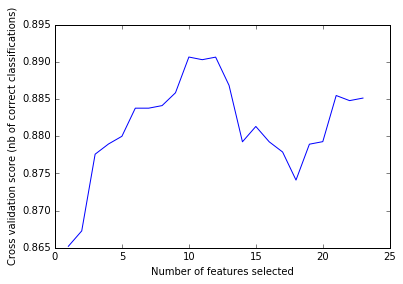

In [43]:
# Build a classification task using 3 informative features
%matplotlib inline
# Create the RFE object and compute a cross-validated score.
svc = SVC(kernel="linear")
# The "accuracy" scoring is proportional to the number of correct
# classifications
rfecv = RFECV(estimator=svc, step=1, cv=StratifiedKFold(10),
              scoring='accuracy')
rfecv.fit(X, Y_TrainData)

print("Optimal number of features : %d" % rfecv.n_features_)

# Plot number of features VS. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (nb of correct classifications)")
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
plt.show()

In [44]:
result_reviewer_hotelID_median=result_reviewer_hotelID
result_reviewer_hotelID_median_test = result_reviewer_hotelID_test
median=[]
alist=["usefulCount_y","coolCount_y","funnyCount_y","reviewCount_x","friendCount","firstCount","MNR",'complimentCount','tipCount']

for i in alist:
    median=result_reviewer_hotelID_median[i].mean()
    median_test=result_reviewer_hotelID_median_test[i].mean()
    result_reviewer_hotelID_median[i]=result_reviewer_hotelID_median[i].fillna(median)
    result_reviewer_hotelID_median_test[i]=result_reviewer_hotelID_median_test[i].fillna(median_test)



result_reviewer_hotelID_median = pd.concat([result_reviewer_hotelID_median['funnyCount_y'], result_reviewer_hotelID_median['usefulCount_y'],result_reviewer_hotelID_median['coolCount_y'],result_reviewer_hotelID_median['reviewCount_x'],result_reviewer_hotelID_median['friendCount'],result_reviewer_hotelID_median['firstCount'],result_reviewer_hotelID_median['complimentCount'],result_reviewer_hotelID_median['MNR'],result_reviewer_hotelID_median['tipCount']], axis=1)
result_reviewer_hotelID_median_test = pd.concat([result_reviewer_hotelID_median_test['funnyCount_y'], result_reviewer_hotelID_median_test['usefulCount_y'],result_reviewer_hotelID_median_test['coolCount_y'],result_reviewer_hotelID_median_test['reviewCount_x'],result_reviewer_hotelID_median_test['friendCount'],result_reviewer_hotelID_median_test['firstCount'],result_reviewer_hotelID_median_test['complimentCount'],result_reviewer_hotelID_median_test['MNR'],result_reviewer_hotelID_median_test['tipCount']], axis=1)

In [45]:
result_reviewer_hotelID_median=preprocessing.normalize(result_reviewer_hotelID_median)
result_reviewer_hotelID_median_test=preprocessing.normalize(result_reviewer_hotelID_median_test)

Feature ranking:
1. feature 14 (0.179228)
2. feature 7 (0.072485)
3. feature 5 (0.065107)
4. feature 18 (0.062299)
5. feature 13 (0.061947)
6. feature 4 (0.057322)
7. feature 15 (0.057240)
8. feature 1 (0.055093)
9. feature 16 (0.049570)
10. feature 8 (0.044109)
11. feature 9 (0.038480)
12. feature 6 (0.031920)
13. feature 10 (0.028664)
14. feature 0 (0.028033)
15. feature 19 (0.026374)
16. feature 22 (0.025965)
17. feature 12 (0.025238)
18. feature 11 (0.023795)
19. feature 21 (0.017521)
20. feature 17 (0.016801)
21. feature 2 (0.014927)
22. feature 3 (0.009345)
23. feature 20 (0.008535)


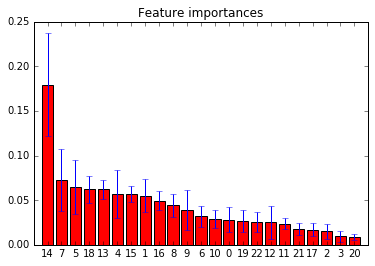

In [48]:
def Random_Forest_feature_Importance():    
    forest = ExtraTreesClassifier(n_estimators=100,random_state=0)
    forest.fit(X, Y_TrainData)
    importances = forest.feature_importances_
    std = np.std([tree.feature_importances_ for tree in forest.estimators_],
                 axis=0)
    indices = np.argsort(importances)[::-1]

    # Print the feature ranking
    print("Feature ranking:")

    for f in range(X.shape[1]):
        print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

    # Plot the feature importances of the forest
    plt.figure()
    plt.title("Feature importances")
    plt.bar(range(X.shape[1]), importances[indices],
           color="r", yerr=std[indices], align="center")
    plt.xticks(range(X.shape[1]), indices)
    plt.xlim([-1, X.shape[1]])
    plt.show()

Random_Forest_feature_Importance()

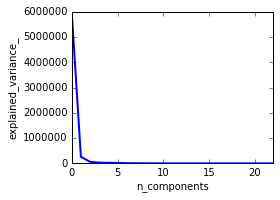

In [51]:
logistic = linear_model.LogisticRegression()

pca = decomposition.PCA()
pipe = Pipeline(steps=[('pca', pca), ('logistic', logistic)])

pca.fit(X)

plt.figure(1, figsize=(4, 3))
plt.clf()
plt.axes([.2, .2, .7, .7])
plt.plot(pca.explained_variance_, linewidth=2)
plt.axis('tight')
plt.xlabel('n_components')
plt.ylabel('explained_variance_')

In [55]:
n_components = [1,2,3,4,5]
Cs = np.logspace(-4, 4, 3)

#Parameters of pipelines can be set using ‘__’ separated parameter names:

estimator = GridSearchCV(pipe,
                         dict(pca__n_components=n_components,
                              logistic__C=Cs))
estimator.fit(X,Y_TrainData)


GridSearchCV(cv=None, error_score='raise',
       estimator=Pipeline(steps=[('pca', PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)), ('logistic', LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False))]),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'logistic__C': array([  1.00000e-04,   1.00000e+00,   1.00000e+04]), 'pca__n_components': [1, 2, 3, 4, 5]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring=None, verbose=0)

In [ ]:

# This dataset is way too high-dimensional. Better do PCA:
pca = PCA(n_components=2)

# Maybe some original features where good, too?
selection = SelectKBest(k=1)

# Build estimator from PCA and Univariate selection:

combined_features = FeatureUnion([("pca", pca), ("univ_select", selection)])

# Use combined features to transform dataset:
X_features = combined_features.fit(X, Y_TrainData).transform(X)

svm = SVC(kernel="linear")

# Do grid search over k, n_components and C:

pipeline = Pipeline([("features", combined_features), ("svm", svm)])

param_grid = dict(features__pca__n_components=[1, 2, 3],
                  features__univ_select__k=[1, 2],
                  svm__C=[0.1, 1, 10])

grid_search = GridSearchCV(pipeline, param_grid=param_grid, verbose=10)
grid_search.fit(X, Y_TrainData)

Fitting 3 folds for each of 18 candidates, totalling 54 fits
[CV] features__pca__n_components=1, svm__C=0.1, features__univ_select__k=1 
[CV]  features__pca__n_components=1, svm__C=0.1, features__univ_select__k=1, score=0.873196, total=   0.5s
[CV] features__pca__n_components=1, svm__C=0.1, features__univ_select__k=1 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


[CV]  features__pca__n_components=1, svm__C=0.1, features__univ_select__k=1, score=0.871134, total=   2.7s
[CV] features__pca__n_components=1, svm__C=0.1, features__univ_select__k=1 
[CV]  features__pca__n_components=1, svm__C=0.1, features__univ_select__k=1, score=0.553719, total=   0.2s
[CV] features__pca__n_components=1, svm__C=1, features__univ_select__k=1 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    3.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.4s remaining:    0.0s


[CV]  features__pca__n_components=1, svm__C=1, features__univ_select__k=1, score=0.875258, total=   0.7s
[CV] features__pca__n_components=1, svm__C=1, features__univ_select__k=1 


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    4.1s remaining:    0.0s


[CV]  features__pca__n_components=1, svm__C=1, features__univ_select__k=1, score=0.874227, total=   3.2s
[CV] features__pca__n_components=1, svm__C=1, features__univ_select__k=1 


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    7.4s remaining:    0.0s


[CV]  features__pca__n_components=1, svm__C=1, features__univ_select__k=1, score=0.559917, total=   0.8s
[CV] features__pca__n_components=1, svm__C=10, features__univ_select__k=1 


[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    8.2s remaining:    0.0s


### Classifier - Text Mining

In [ ]:
def FindBestEstimatorRandomForest(inputData,inputLabels): 

    clfs = [ ("RandomForestClassifier, max_features=None",RandomForestClassifier(warm_start=True, max_features=None, oob_score=True,random_state=50))]


    error_rate = OrderedDict((label, []) for label, _ in clfs)


    min_estimators = 50
    max_estimators = 200
    #replacement_method = ["zero",'rowmean',"colmean",'rowmedian','colmedian','rowmax','colmax','rowmode','colmode','rowmean_per_spectral','rowmedian_per_spectral','rowmode_per_spectral','interpolate_missing']

    for label, clf in clfs:
            for i in range(min_estimators, max_estimators + 1):
                clf.set_params(n_estimators=i)
                clf.fit(inputData,inputLabels)
                oob_error = 1 - clf.oob_score_
                error_rate[label].append((i, oob_error))


    for label, clf_err in error_rate.items():
        xs, ys = zip(*clf_err)
        plt.plot(xs, ys, label=label)

    print(xs[ys.index(min(ys))])

In [ ]:
#Decision Tree
score_u=[]
score_nb= CrossValidation_DecisionTreeClassifier(train_u_tfidf,Y_TrainData)
print(score_nb)
score_bow_dt.append(score_nb)


In [ ]:
#Naive Bayes
score_nb= CrossValidation_NaiveBayesClassifier(train_u_tfidf,Y_TrainData)
print(score_nb)
score_u.append(score_nb)



In [ ]:
#Random Forest
score= CrossValidation_RandomForest(train_u_tfidf,Y_TrainData)
print(score)
score_u.append(score)


In [ ]:
#Adaboost

score= CrossValidation_LogisticRegression_AdaboostClassifier(train_u_tfidf,Y_TrainData)
print(score)
score_u.append(score)

In [ ]:
#KNN
score= CrossValidation_(train_u_tfidf,Y_TrainData_15)
print(score)
score_u.append(score)

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

get_ipython().magic(u'matplotlib inline')
plt.plot(score_bow_nb[0], label = "Naive-Bayes")
plt.plot(score_bow_knn[0], label = "K-Nearest Neighbours")
plt.plot(score_bow_rf[0], label = "Random Forest Classifier n=50")
plt.plot(score_bow_dt[0], label = "Decision Tree")
plt.plot(score_bow_lg[0], label = "Logistic Regression")
plt.plot(score_bow_adaboost[0], label = "Adaboost Classifier")
labels = ["unigram","bigram","3-grams","4-grams"]
plt.xticks(np.arange(len(labels)), labels, rotation='vertical')

plt.ylabel('Scores')
plt.xlabel('N-Grams used')
plt.legend(bbox_to_anchor=(1.10, 1), loc=2, borderaxespad=0.)
plt.show()

## Maximum Content Similarity

In [30]:
candidate_list = result_reviewer_hotelID.groupby('reviewerID')['tokenized_reviewContent'].apply(lambda x:','.join(x))
candidate_list_test = result_reviewer_hotelID_test.groupby('reviewerID')['tokenized_reviewContent'].apply(lambda x:','.join(x))
# print candidate_list

# FilteredData_Train
# candidate_list = ['orange', 'banana', 'apple1', 'pineapple']
# target = 'apple'

MCS = []
MCS_test = []
vec = CountVectorizer()

vec.fit(candidate_list)
np.set_printoptions(threshold=np.nan)
mcs = pairwise_kernels(vec.transform(candidate_list),
metric='cosine')
mcs_test = pairwise_kernels(vec.transform(candidate_list_test),
metric='cosine')

# MCS = np.median(np.array(mcs))

for x in mcs:
    MCS.append(np.median(np.array(x)))
    
for x in mcs_test:
    MCS_test.append(np.median(np.array(x)))

In [31]:
reviewerIDs = result_reviewer_hotelID.groupby(['reviewerID']).groups.keys()

reviewerIDs_test = result_reviewer_hotelID_test.groupby(['reviewerID']).groups.keys()
pd.set_option('display.max_rows', 5000)
df_mcs = DataFrame({'reviewerID': reviewerIDs, 'MCS': MCS})
df_mcs_test = DataFrame({'reviewerID': reviewerIDs_test, 'MCS': MCS_test})
# print(df_mcs)

In [32]:
train_index=df_mcs['reviewerID'][0]
train_keys = list(train_index)
train_mcs_result=pd.DataFrame(train_keys,columns=["reviewerID"])
train_mcs_result['MCS']=df_mcs['MCS']
train_mcs_result

test_index=df_mcs_test['reviewerID'][0]
test_keys = list(test_index)
test_mcs_result=pd.DataFrame(test_keys,columns=["reviewerID"])
test_mcs_result['MCS']=df_mcs_test['MCS']
# test_mcs_result

In [33]:
result_reviewer_hotelID_updated = pd.merge(result_reviewer_hotelID, train_mcs_result,how='left',on=['reviewerID'])
result_reviewer_hotelID_updated_test = pd.merge(result_reviewer_hotelID_test, test_mcs_result, how='left', on=['reviewerID'])
#result_reviewer_hotelID_updated=result_reviewer_hotelID
#result_reviewer_hotelID_updated_test =result_reviewer_hotelID_test 


### Normalization

In [35]:
#Training
#df_tra=result_reviewer_hotelID_updated
df_tra=result_reviewer_hotelID_updated
df_tra['friendCount']=df_tra[['friendCount']].astype(float)
df_tra['filReviewCount']=df_tra[['filReviewCount']].astype(float)
#cols_to_norm = ['usefulCount_x','coolCount_x','funnyCount_x','usefulCount_y','coolCount_y','funnyCount_y','friendCount','reviewCount_y','firstCount','complimentCount','tipCount','fanCount','RL','filReviewCount']
#cols_to_norm = ['rating_x','usefulCount_x','coolCount_x','funnyCount_x','reviewCount_x','friendCount','AcceptsCreditCards','PriceRange','firstCount','WiFi','complimentCount','tipCount','fanCount','reviewCount_y','rating_y','filReviewCount']
cols_to_norm = ['rating_x','usefulCount_x','coolCount_x','funnyCount_x','reviewCount_x','friendCount','firstCount','complimentCount','tipCount','fanCount','MNR','PPR','RL','reviewCount_y','rating_y','filReviewCount','ARD','MCS']



tra_temp=df_tra[cols_to_norm]
tra_temp['MNR']=tra_temp.round({'MNR': 3})
tra_temp=tra_temp.fillna(0)

tra_temp = pd.DataFrame(tra_temp, columns=[cols_to_norm])
train_temp=preprocessing.normalize(tra_temp)

#Testing
df_test=result_reviewer_hotelID_updated_test
df_test['friendCount']=df_test[['friendCount']].astype(float)
df_test['filReviewCount']=df_test[['filReviewCount']].astype(float)

test_temp=df_test[cols_to_norm]
test_temp['MNR']=test_temp.round({'MNR': 3})
test_temp=test_temp.fillna(0)
test_temp = pd.DataFrame(test_temp, columns=[cols_to_norm])

test_temp=preprocessing.normalize(test_temp)


//anaconda/envs/py35/lib/python3.5/site-packages/ipykernel/__main__.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
//anaconda/envs/py35/lib/python3.5/site-packages/ipykernel/__main__.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


### Classifier Result

In [36]:
score_featuremcs=[]
score = CrossValidation_RandomForestn138(tra_temp,Y_TrainData)
print(score)
score_featuremcs.append(score)

[0.79986014380897941]


In [37]:
score_featuremcs=[]
score = CrossValidation_RandomForestn150(tra_temp,Y_TrainData)
print(score)
score_featuremcs.append(score)

[0.78264666544781747]


In [38]:
score = CrossValidation_DecisionTreeClassifier(tra_temp,Y_TrainData)
print(score)
score_featuremcs.append(score)

[0.71352472998114114]


In [39]:
score = CrossValidation_NaiveBayesClassifier(tra_temp,Y_TrainData)
print(score)
score_featuremcs.append(score)

[0.74760631635741492]


In [40]:
score = CrossValidation_LogisticRegression(tra_temp,Y_TrainData)
print(score)
score_featuremcs.append(score)

[0.85008699593996639]


In [41]:
score = CrossValidation_KNearestNeighbours(tra_temp,Y_TrainData,33)
print(score)
score_featuremcs.append(score)

[0.79578603457601271]


In [43]:
score = CrossValidation_SupportVectorMachine(tra_temp,Y_TrainData)
print(score)
score_featuremcs.append(score)

[0.84940561727530639]


In [44]:
score = CrossValidation_LogisticRegression_AdaboostClassifier(tra_temp,Y_TrainData)
print(score)
score_featuremcs.append(score)

[0.74110245664652363]


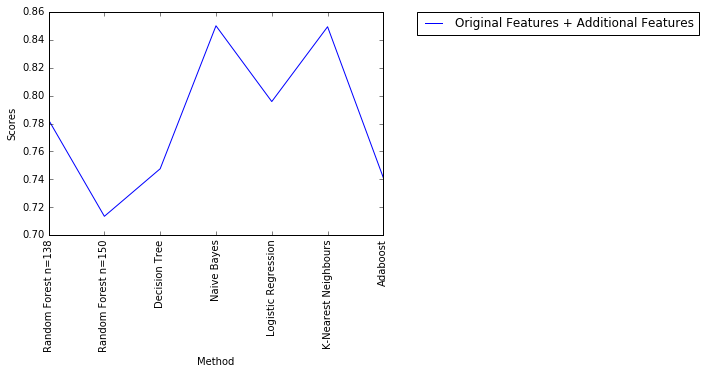

In [45]:
get_ipython().magic(u'matplotlib inline')
plt.plot(score_featuremcs, label = "Original Features + Additional Features")
#plt.plot(score_median, label = "Replacement method Median")
labels = ["Random Forest n=138","Random Forest n=150","Decision Tree","Naive Bayes","Logistic Regression","K-Nearest Neighbours","Adaboost"]
plt.xticks(np.arange(len(labels)), labels, rotation='vertical')

plt.ylabel('Scores')
plt.xlabel('Method')
plt.legend(bbox_to_anchor=(1.10, 1), loc=2, borderaxespad=0.)
plt.show()

### Using Original Features

In [46]:
result_hotelID = pd.merge(Data, data_hotels, how='left', on=['hotelID'])
result_hotelID_test = pd.merge(testData, data_hotels, how='left', on=['hotelID'])

# Merging Columns based on Reviewer ID,
result_reviewerID = pd.merge(Data, data_reviewers, how='left', on=['reviewerID'])
result_reviewerID_test = pd.merge(testData, data_reviewers, how='left', on=['reviewerID'])

result_reviewer_hotelID = pd.merge(result_reviewerID, data_hotels, how='left', on=['hotelID'])
result_reviewer_hotelID_test = pd.merge(result_reviewerID_test, data_hotels, how='left', on=['hotelID'])

In [47]:
result_reviewer_hotelID = result_reviewer_hotelID.drop(['fake','date','yelpJoinDate','phoneNumber','location_x','location_y','address','name_x','name_y','reviewID','reviewerID','hotelID','AcceptsCreditCards','PriceRange','WiFi','reviewContent','categories','webSite'], axis=1)
#result_reviewer_hotelID = result_reviewer_hotelID.fillna(0)

result_reviewer_hotelID_test = result_reviewer_hotelID_test.drop(['date','yelpJoinDate','phoneNumber','location_x','location_y','address','name_x','name_y','reviewID','reviewerID','hotelID','AcceptsCreditCards','PriceRange','WiFi','reviewContent','categories','webSite'], axis=1)
#result_reviewer_hotelID_test = result_reviewer_hotelID_test.fillna(0)
result_reviewer_hotelID.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2908 entries, 0 to 2907
Data columns (total 16 columns):
rating_x           2908 non-null int64
usefulCount_x      2908 non-null int64
coolCount_x        2908 non-null int64
funnyCount_x       2908 non-null int64
friendCount        2903 non-null float64
reviewCount_x      2903 non-null float64
firstCount         2903 non-null float64
usefulCount_y      2903 non-null float64
coolCount_y        2903 non-null float64
funnyCount_y       2903 non-null float64
complimentCount    2903 non-null float64
tipCount           2903 non-null float64
fanCount           2903 non-null float64
reviewCount_y      2908 non-null int64
rating_y           2908 non-null float64
filReviewCount     2908 non-null object
dtypes: float64(10), int64(5), object(1)
memory usage: 386.2+ KB


In [48]:
#Replacement Zero
result_reviewer_hotelID_zero = result_reviewer_hotelID.fillna(0)
result_reviewer_hotelID_zero_test = result_reviewer_hotelID_test.fillna(0)
#cols_name=["usefulCount_y","coolCount_y","funnyCount_y","reviewCount_x","complimentCount","friendCount","firstCount","tipCount"]
#result_reviewer_hotelID_zero =result_reviewer_hotelID_zero[cols_name]
#result_reviewer_hotelID_zero_test =result_reviewer_hotelID_zero_test[cols_name]




In [49]:
result_reviewer_hotelID_median=result_reviewer_hotelID
result_reviewer_hotelID_median_test = result_reviewer_hotelID_test
median=[]
list=["rating_x","filReviewCount","usefulCount_y","coolCount_y","funnyCount_y","reviewCount_x","complimentCount","friendCount","firstCount","tipCount"]

for i in list:
    median=result_reviewer_hotelID_median[list].median()
    median_test=result_reviewer_hotelID_median_test[list].median()
    result_reviewer_hotelID_median[list]=result_reviewer_hotelID_median[list].fillna(median)
    result_reviewer_hotelID_median_test[list]=result_reviewer_hotelID_median_test[list].fillna(median_test)



#result_reviewer_hotelID_median = pd.concat([result_reviewer_hotelID_median['funnyCount_y'], result_reviewer_hotelID_median['usefulCount_y'],result_reviewer_hotelID_median['coolCount_y'],result_reviewer_hotelID_median['reviewCount_x'],result_reviewer_hotelID_median['friendCount'],result_reviewer_hotelID_median['complimentCount'],result_reviewer_hotelID_median['tipCount'],result_reviewer_hotelID_median['firstCount']], axis=1)
#result_reviewer_hotelID_median_test = pd.concat([result_reviewer_hotelID_median_test['funnyCount_y'], result_reviewer_hotelID_median_test['usefulCount_y'],result_reviewer_hotelID_median_test['coolCount_y'],result_reviewer_hotelID_median_test['reviewCount_x'],result_reviewer_hotelID_median_test['friendCount'],result_reviewer_hotelID_median_test['complimentCount'],result_reviewer_hotelID_median_test['tipCount'],result_reviewer_hotelID_median_test['firstCount']], axis=1)

In [50]:
result_reviewer_hotelID_median_test['complimentCount'].median()
result_reviewer_hotelID_median_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2950 entries, 0 to 2949
Data columns (total 16 columns):
rating_x           2950 non-null int64
usefulCount_x      2950 non-null int64
coolCount_x        2950 non-null int64
funnyCount_x       2950 non-null int64
friendCount        2950 non-null float64
reviewCount_x      2950 non-null float64
firstCount         2950 non-null float64
usefulCount_y      2950 non-null float64
coolCount_y        2950 non-null float64
funnyCount_y       2950 non-null float64
complimentCount    2950 non-null float64
tipCount           2950 non-null float64
fanCount           2946 non-null float64
reviewCount_y      2949 non-null float64
rating_y           2949 non-null float64
filReviewCount     2950 non-null float64
dtypes: float64(12), int64(4)
memory usage: 391.8 KB


In [51]:
df_tra_median=result_reviewer_hotelID_median
df_tra_zero = result_reviewer_hotelID_zero

df_test_median=result_reviewer_hotelID_median_test
df_test_zero = result_reviewer_hotelID_zero_test

features_5=['usefulCount_y','filReviewCount','reviewCount_x','friendCount','rating_x']
features_8=["usefulCount_y","coolCount_y","funnyCount_y","reviewCount_x","complimentCount","friendCount","firstCount","tipCount"]

df_tra_median_5=df_tra_median[features_5]
df_tra_median_8=df_tra_median[features_8]

df_tra_zero_5=df_tra_zero[features_5]
df_tra_zero_8=df_tra_zero[features_8]

df_test_median_5=df_test_median[features_5]
df_test_median_8=df_test_median[features_8]

df_test_zero_5=df_test_zero[features_5]
df_test_zero_8=df_test_zero[features_8]


In [52]:
df_tra_median_5=preprocessing.normalize(df_tra_median_5)
df_tra_median_8=preprocessing.normalize(df_tra_median_8)

df_test_median_5=preprocessing.normalize(df_test_median_5)
df_test_median_8=preprocessing.normalize(df_test_median_8)

df_tra_zero_5=preprocessing.normalize(df_tra_zero_5)
df_tra_zero_8=preprocessing.normalize(df_tra_zero_8)

df_test_zero_5=preprocessing.normalize(df_test_zero_5)
df_test_zero_8=preprocessing.normalize(df_test_zero_8)




In [54]:
#Classifier for Data with median as replacement method:

score_original_median_5=[]

#RF
score_median = CrossValidation_RandomForestn166(df_tra_median_5,Y_TrainData)
print(score_median)
score_original_median_5.append(score_median)

score_median = CrossValidation_RandomForestn150(df_tra_median_5,Y_TrainData)
print(score_median)
score_original_median_5.append(score_median)

#DT
score_median = CrossValidation_DecisionTreeClassifier(df_tra_median_5,Y_TrainData)
print(score_median)
score_original_median_5.append(score_median)

#NB
score_median = CrossValidation_NaiveBayesClassifier(df_tra_median_5,Y_TrainData)
print(score_median)
score_original_median_5.append(score_median)

#LG
score_median = CrossValidation_LogisticRegression(df_tra_median_5,Y_TrainData)
print(score_median)
score_original_median_5.append(score)

#KNN
score_median = CrossValidation_KNearestNeighbours(df_tra_median_5,Y_TrainData,15)
print(score_median)
score_original_median_5.append(score_median)

#SVM
score_median = CrossValidation_SupportVectorMachine(df_tra_median_5,Y_TrainData)
print(score_median)
score_original_median_5.append(score_median)

#Adaboost
score_median = CrossValidation_LogisticRegression_AdaboostClassifier(df_tra_median_5,Y_TrainData)
print(score_median)
score_original_median_5.append(score_median)







[0.86349679354111009]
[0.86314724639976637]
[0.82739533554128253]
[0.8572728176668154]
[0.87894184092054739]
[0.88101433488927827]
[0.87207073265362056]
[0.87381139915713146]


In [55]:
score_original_median_8=[]

#RF
score_median = CrossValidation_RandomForestn166(df_tra_median_8,Y_TrainData)
print(score_median)
score_original_median_8.append(score_median)

score_median = CrossValidation_RandomForestn150(df_tra_median_8,Y_TrainData)
print(score_median)
score_original_median_8.append(score_median)

#DT
score_median = CrossValidation_DecisionTreeClassifier(df_tra_median_8,Y_TrainData)
print(score_median)
score_original_median_8.append(score_median)

#NB
score_median = CrossValidation_NaiveBayesClassifier(df_tra_median_8,Y_TrainData)
print(score_median)
score_original_median_8.append(score_median)

#LG
score_median = CrossValidation_LogisticRegression(df_tra_median_8,Y_TrainData)
print(score_median)
score_original_median_8.append(score)

#KNN
score_median = CrossValidation_KNearestNeighbours(df_tra_median_8,Y_TrainData,15)
print(score_median)
score_original_median_8.append(score_median)

#SVM
score_median = CrossValidation_SupportVectorMachine(df_tra_median_8,Y_TrainData)
print(score_median)
score_original_median_8.append(score_median)

#Adaboost
score_median = CrossValidation_LogisticRegression_AdaboostClassifier(df_tra_median_8,Y_TrainData)
print(score_median)
score_original_median_8.append(score_median)



[0.90097695617295892]
[0.90200788806610654]
[0.87207843999242241]
[0.8095158546411525]
[0.90200257906203274]
[0.87654758255011822]
[0.89926288744506577]
[0.89822722584104631]


In [57]:
score_original_zero_5=[]

#RF
score_zero = CrossValidation_RandomForestn166(df_tra_zero_5,Y_TrainData)
print(score_zero)
score_original_zero_5.append(score_zero)

score_zero = CrossValidation_RandomForestn150(df_tra_zero_5,Y_TrainData)
print(score_zero)
score_original_zero_5.append(score_zero)



#DT
score_zero = CrossValidation_DecisionTreeClassifier(df_tra_zero_5,Y_TrainData)
print(score_zero)
score_original_zero_5.append(score_median)

#NB
score_zero= CrossValidation_NaiveBayesClassifier(df_tra_zero_5,Y_TrainData)
print(score_zero)
score_original_zero_5.append(score_median)

#LG
score_zero = CrossValidation_LogisticRegression(df_tra_zero_5,Y_TrainData)
print(score_zero)
score_original_zero_5.append(score)

#KNN
score_zero = CrossValidation_KNearestNeighbours(df_tra_zero_5,Y_TrainData,15)
print(score_zero)
score_original_zero_5.append(score_median)

#SVM
score_zero = CrossValidation_SupportVectorMachine(df_tra_zero_5,Y_TrainData)
print(score_zero)
score_original_zero_5.append(score_median)

#Adaboost
score_zero = CrossValidation_LogisticRegression_AdaboostClassifier(df_tra_zero_5,Y_TrainData)
print(score_zero)
score_original_zero_5.append(score_zero)



[0.86212222106532665]
[0.86074646565456336]
[0.83324554048476784]
[0.85761587084005719]
[0.87928607499972122]
[0.88170103067420413]
[0.87207309446548442]
[0.8714070777231806]


In [56]:
score_original_zero_8=[]

#RF
score_zero = CrossValidation_RandomForestn166(df_tra_zero_8,Y_TrainData)
print(score_zero)
score_original_zero_8.append(score_zero)

score_zero = CrossValidation_RandomForestn150(df_tra_zero_8,Y_TrainData)
print(score_zero)
score_original_zero_8.append(score_zero)

#DT
score_zero = CrossValidation_DecisionTreeClassifier(df_tra_zero_8,Y_TrainData)
print(score_zero)
score_original_zero_8.append(score_median)

#NB
score_zero= CrossValidation_NaiveBayesClassifier(df_tra_zero_8,Y_TrainData)
print(score_zero)
score_original_zero_8.append(score_median)

#LG
score_zero = CrossValidation_LogisticRegression(df_tra_zero_8,Y_TrainData)
print(score_zero)
score_original_zero_8.append(score)

#KNN
score_zero = CrossValidation_KNearestNeighbours(df_tra_zero_8,Y_TrainData,15)
print(score_zero)
score_original_zero_8.append(score_median)

#SVM
score_zero = CrossValidation_SupportVectorMachine(df_tra_zero_8,Y_TrainData)
print(score_zero)
score_original_zero_8.append(score_median)

#Adaboost
score_zero = CrossValidation_LogisticRegression_AdaboostClassifier(df_tra_zero_8,Y_TrainData)
print(score_zero)
score_original_zero_8.append(score_zero)

[0.90166601579879679]
[0.90372610315357371]
[0.87345773203383781]
[0.813299474203663]
[0.90268986631444825]
[0.89822131725329035]
[0.89891806392744977]
[0.89616300024288731]


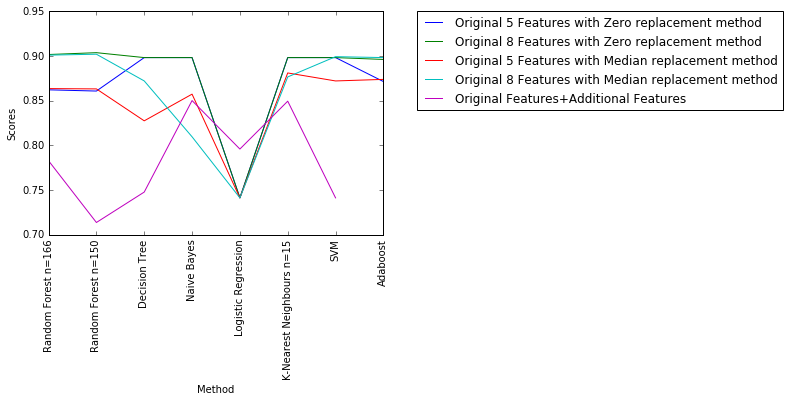

In [59]:
get_ipython().magic(u'matplotlib inline')
plt.plot(score_original_zero_5, label = "Original 5 Features with Zero replacement method")
plt.plot(score_original_zero_8, label = "Original 8 Features with Zero replacement method")
plt.plot(score_original_median_5, label = "Original 5 Features with Median replacement method")
plt.plot(score_original_median_8, label = "Original 8 Features with Median replacement method")
plt.plot(score_featuremcs, label = "Original Features+Additional Features")

#plt.plot(score_median, label = "Replacement method Median")
labels = ["Random Forest n=166","Random Forest n=150","Decision Tree","Naive Bayes","Logistic Regression","K-Nearest Neighbours n=15","SVM","Adaboost"]
plt.xticks(np.arange(len(labels)), labels, rotation='vertical')

plt.ylabel('Scores')
plt.xlabel('Method')
plt.legend(bbox_to_anchor=(1.10, 1), loc=2, borderaxespad=0.)
plt.show()

In [ ]:
## SUBMISSION FOR USING ONLY FEATURES/Features

In [ ]:
#Random forest
clf = RandomForestClassifier(n_estimators=150)
clf.fit(train_final,Y_TrainData)

In [ ]:
pred = clf.predict(test_final)


In [ ]:
def writePrediction_features(Y_testData):
    #Don't forget to change the filename!
    y= open("Prediction_rf100_medianreplacement_nomcsonly.csv","w")
    y.write("Id,Expected" + "\n")
    try:
        xrange
    except NameError:
        xrange = range
    for i in xrange(len(Y_testData)):
        y.write(str(i) + "," + str(int(Y_testData[i]))+ "\n")
    y.close()

In [ ]:
writePrediction_features(pred)
check_pred= pd.read_csv("Prediction_rf100_medianreplacement_nomcsonly.csv")
print(check_pred)


In [ ]:
check_pred['Expected'].value_counts()

In [ ]:
## SUBMISSION USING TEXT MINING ONLY

In [ ]:
#Training Process
train_tokenresult_stemming= result_reviewer_hotelID['reviewContent'].apply(tokenizationStemming)
#result_reviewer_hotelID['tokenized_reviewContent'] = train_tokenresult
train_u_bowvector_stemming= BagOfWords(train_tokenresult_stemming,2,2,5000)
train_u_tfidf_stemming=TFIDFTransformer(train_u_bowvector_stemming)
clf = RandomForestClassifier(n_estimators=150)
clf.fit(train_u_tfidf_stemming,Y_FilteredData_Train)

In [ ]:
#Testing Process
test_tokenresult_stemming=test_result_reviewer_hotelID['reviewContent'].apply(tokenizationStemming)
#testData['tokenized_reviewContent'] = test_tokenresult_stemming
test_u_bowvector_stemming= BagOfWords(test_tokenresult_stemming,1,1,5000)
test_u_tfidf_stemming=TFIDFTransformer(test_u_bowvector_stemming)
pred = clf.predict(test_u_tfidf_stemming)
writePrediction(pred)
check_pred= pd.read_csv("Prediction_tfidf_u_150.csv")
print(check_pred)
check_pred['Expected'].value_counts()

In [ ]:
def writePrediction_textmining(Y_testData):
    y= open("Prediction_rf96_withmcs.csv","w")
    y.write("Id,Expected" + "\n")
    try:
        xrange
    except NameError:
        xrange = range
    for i in xrange(len(Y_testData)):
        y.write(str(i) + "," + str(int(Y_testData[i]))+ "\n")
    y.close()

In [ ]:
writePrediction_textmining(pred)
check_pred= pd.read_csv("Prediction_tfidf_u_150.csv")
print(check_pred)
check_pred['Expected'].value_counts()